# **Vector field alignment**


Импортируем библиотеки

In [1]:
import autograd
import autograd.numpy as np

import pymanopt
from pymanopt.manifolds import Stiefel
from pymanopt import Problem
from pymanopt.solvers import SteepestDescent

import matplotlib.pyplot as plt
%matplotlib inline


In [2]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation
import matplotlib
from IPython.display import HTML

# **Вспомогательные функции**

Напишем функцию, генерирующую выборку на многообразии. Будем работать со сферической шапочкой.

Сферическая шапочка --- множество точек сферы с центром в нуле и радиусом $R$, лежащих выше плоскости $z = a R$. Здесь $0< a < 1$ --- параметр, задающий сферическую шапочку. 


Будем использовать параметризацию точек сферической шапочки $(\varphi, \, c)$, где $\varphi \in [0, \, 2\pi)$ --- угол, соответствующий проекции точки сферической шапочки на $Oxy$, 

$c \in [a, \,1)$ --- косинус угла между точкой сферической шапочки и осью $Oz$. Ясно, что $c = \cos(\theta)$. 

В координатах $(\varphi, \, c)$ элемент площади сферической шапочки $dS$ выражается по формуле: $d S = d \varphi \, dc$. Это позволит нам генерировать равномерную выборку на сферической шапочке.

In [3]:
def gen_points(R, a, n):    # R --- radius of spherical cap
    '''Returns n \times 3 array'''

    c = np.random.uniform(a, 1, n)   # c = cos(\theta)     
    phi = np.random.uniform(0, 2 * np.pi, n)
      
    x = np.reshape(R * np.cos(phi) * np.sqrt(1 - c**2), (-1, 1))
    y = np.reshape(R * np.sin(phi) * np.sqrt(1 - c**2), (-1, 1))
    z = np.reshape(R * c, (-1, 1))

    return np.concatenate([x, y, z], axis=1)

Визуализируем сгенерированную выборку.

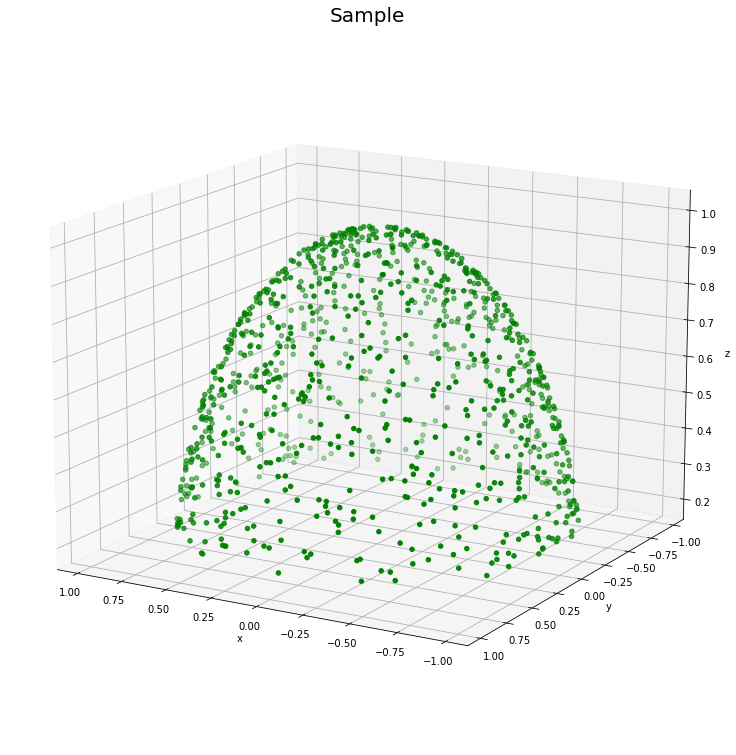

In [4]:
X_n = gen_points(R=1, a=0.2, n=1000)

fig = plt.figure(figsize = (12, 10)) 
ax = Axes3D(fig)

ax.scatter3D(X_n.T[0], X_n.T[1], X_n.T[2], color = "green"); 
plt.title("Sample", fontsize=20) 
ax.set_xlabel('x')  
ax.set_ylabel('y')  
ax.set_zlabel('z')

ax.view_init(15, 120)

plt.show()

Функция $f$ --- глобальная карта сферической шапочки.

In [5]:
def f(R, a, phi, c):  #  chart of manifold
    if c < a:
        raise ValueError("Wrong input")
    elif c >= 1.0:
        raise ValueError("Wrong input")
        
    x = R * np.cos(phi) * np.sqrt(1 - c**2)
    y = R * np.sin(phi) * np.sqrt(1 - c**2)
    z = R * c
    
    return np.array([x, y, z])


J --- якобиан отображения $f$. Это $3 \times 2$ матрица, столбцы которой --- трехмерные векторы, лежащие в касательном пространстве. 

Более того, эти два трехмерных вектора будут ортогональными (это следует из реализации функции J).

In [6]:
def J(R, a, phi, c):  # Jacobian of f
    '''Returns 3 \times 2 array'''
    if c < a:
        raise ValueError("Wrong input")
    elif c >= 1.0:
        raise ValueError("Wrong input")

    x = - R * np.sin(phi) * np.sqrt(1 - c**2)
    y = R * np.cos(phi) * np.sqrt(1 - c**2)
    z = 0

    d_phi = np.reshape(np.array([x, y, z]), (-1, 1))

    x = - R * np.cos(phi) * c / np.sqrt(1 - c**2)
    y = - R * np.sin(phi) * c / np.sqrt(1 - c**2)
    z = R                                            
   
    d_c = np.reshape(np.array([x, y, z]), (-1, 1))
    return np.concatenate([d_phi, d_c], axis=1)

Функция $H$ возвращает ту же самую $3 \times 2$ матрицу, что и $J$, но ее столбцы нормированы (имеют единичную длину).

In [7]:
def H(R, a, phi, c):  # Normalized Jacobian of f
    if c < a:
        raise ValueError("Wrong input")
    elif c >= 1.0:
        raise ValueError("Wrong input")

    x = - R * np.sin(phi) * np.sqrt(1 - c**2)
    y = R * np.cos(phi) * np.sqrt(1 - c**2)
    z = 0
    d_phi = np.array([x, y, z])
    d_phi = d_phi / np.linalg.norm(d_phi)
    d_phi = np.reshape(d_phi, (-1, 1))

    x = - R * np.cos(phi) * c / np.sqrt(1 - c**2)
    y = - R * np.sin(phi) * c / np.sqrt(1 - c**2)
    z = R
  
    d_c = np.array([x, y, z])
    d_c = d_c / np.linalg.norm(d_c)
    d_c = np.reshape(d_c, (-1, 1))
    
    return np.concatenate([d_phi, d_c], axis=1)

Гауссово ядро

In [8]:
def K(X, Z, epsilon):   # gaussian kernel
    return np.exp(-(np.linalg.norm(X - Z)**2)/(epsilon**2))

Локальный PCA

In [9]:
def local_pca(X, X_n, epsilon):           # X_n --- n points on manifold,          
                                          # X --- point on manifold
    n = np.shape(X_n)[0]
    S = np.zeros((3, 3))
  
    for i in range(n):
        S += K(X_n[i], X, epsilon) * np.matmul(np.reshape(X_n[i] - X, (3, 1)), np.reshape(X_n[i] - X, (1, 3))) 
  
    w, v = np.linalg.eigh(S)
    return v[:, 1:].T

Обратное отображение к $f$. По точке сферической шапочки возвращает ее координаты.

In [10]:
def f_inverse(R, a, X): # returns \phi, c --- coordinates of X
    x, y, z = X
    
    c = z / R

    if c < a:
        raise ValueError("Wrong input")
    elif c >= 1.0:
        raise ValueError("Wrong input")

    phi = np.arctan2(y, x)

    return phi, c
        

# **Main part**

Зададим все параметры.

In [11]:
R = 1
a = 0.2
n = 200   # размер выборки
eps = 0.3  # параметр гауссова ядра

In [12]:
X_n = gen_points(R, a, n)  # выборка

H_n = []
for i in range(n):
    phi, c = f_inverse(R, a, X_n[i])
    H_n.append(H(R, a, phi, c))     # ортонормированнные базисы касательных пространств в точках выборки
                                    # эти базисы непрерывно зависят от точки 

X = gen_points(R, a, 1)[0]   # случайная точка вне выборки

Запустим Local PCA в точке X. Результат работы `local_pca` $- \, 3 \times 2$ матрица, столбцы которой $-$ трехмерные векторы, примерно лежащие в касательном пространстве к многообразию в точке X.

In [13]:
Q = local_pca(X, X_n, eps).T    # Local PCA result

In [14]:
Q.shape

(3, 2)

Зададим неправильно ориентированный ортонормированный базис в точке X.




In [15]:
manifold = Stiefel(2, 2)
v = manifold.rand()           # случайная ортогональная 2 \times 2 матрица

H_X = np.matmul(Q, v)    # исходный неправильно ориентированный базис в точке X

Визуализируем непрерывные базисы в точках выборки и неправильно ориентированный по отношению к ним базис в точке X.

In [16]:
fig = plt.figure(figsize = (15, 10)) 

fig.suptitle('Initial', fontsize=20)

ax = Axes3D(fig)

scat = ax.scatter3D(X_n.T[0], X_n.T[1], X_n.T[2], color = "green")

ax.set_xlabel('x')  
ax.set_ylabel('y')  
ax.set_zlabel('z')

ax.quiver(X[0], X[1], X[2], H_X.T[0][0], H_X.T[0][1], H_X.T[0][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)#linewidths=1)
ax.quiver(X[0], X[1], X[2], H_X.T[1][0], H_X.T[1][1], H_X.T[1][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)
phi, c = f_inverse(R, a, X)

for i in range(30):
    fi, _ = f_inverse(R, a, X_n[i])
    ax.quiver(X_n[i][0], X_n[i][1], X_n[i][2], H_n[i].T[0][0], H_n[i].T[0][1], H_n[i].T[0][2], length=0.15, color = 'blue',  arrow_length_ratio=0.5, pivot='tail', alpha = 0.333*(2 + np.cos(fi - phi)))#linewidths=1)
    ax.quiver(X_n[i][0], X_n[i][1], X_n[i][2], H_n[i].T[1][0], H_n[i].T[1][1], H_n[i].T[1][2], length=0.15, color = 'blue',  arrow_length_ratio=0.5, pivot='tail', alpha = 0.333*(2 + np.cos(fi - phi)))

    
plt.axis('off')

def animate(frame):
    ax.view_init(15, (180*phi/np.pi) + frame/2)
    plt.pause(.001)
    return fig

anim = FuncAnimation(fig, animate, frames=200, interval=50)
plt.close()

Uncomment next cell to save animation

In [17]:
# anim.save('ani_1.gif')

Uncomment next cell to show animation in this notebook

In [18]:
HTML(anim.to_jshtml())

Здесь красным показан базис в точке X, 

синим --- базисы в точках выборки

Перейдем к выравниванию базиса в точке X

Loss function

In [19]:
def cost(v): 
    loss = 0
    for j in range(n):
        loss += 0.5 * K(X, X_n[j], eps) * (np.linalg.norm(np.matmul(Q, v) - H_n[j], ord='fro') ** 2)

    return loss

In [20]:
problem = Problem(manifold=Stiefel(2, 2), cost=cost, verbosity=0)

In [21]:
solver = SteepestDescent(maxiter=1)

v_opt = v

H_opt = np.matmul(Q, v_opt)

Визуализация выравнивания базиса

In [22]:
fig = plt.figure(figsize = (14, 9)) 
fig.suptitle('Optimization', fontsize=20)

ax = Axes3D(fig)

ax.scatter3D(X_n.T[0], X_n.T[1], X_n.T[2], color = "green")

ax.set_xlabel('x')  
ax.set_ylabel('y')  
ax.set_zlabel('z')

quiver_one = ax.quiver(X[0], X[1], X[2], H_opt.T[0][0], H_opt.T[0][1], H_opt.T[0][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)#linewidths=1)
quiver_two = ax.quiver(X[0], X[1], X[2], H_opt.T[1][0], H_opt.T[1][1], H_opt.T[1][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)
phi, c = f_inverse(R, a, X)

for i in range(30):
    fi, _ = f_inverse(R, a, X_n[i])
    ax.quiver(X_n[i][0], X_n[i][1], X_n[i][2], H_n[i].T[0][0], H_n[i].T[0][1], H_n[i].T[0][2], length=0.15, color = 'blue',  arrow_length_ratio=0.5, pivot='tail', alpha = 0.333*(2 + np.cos(fi - phi)))#linewidths=1)
    ax.quiver(X_n[i][0], X_n[i][1], X_n[i][2], H_n[i].T[1][0], H_n[i].T[1][1], H_n[i].T[1][2], length=0.15, color = 'blue',  arrow_length_ratio=0.5, pivot='tail', alpha = 0.333*(2 + np.cos(fi - phi)))


plt.axis('off')
plt.close()

def animate(i):
  
    global quiver_one
    global quiver_two
    global v_opt
    global H_opt

    quiver_one.remove()
    quiver_two.remove()
  
    if i > 0:
        v_opt = solver.solve(problem, x=v_opt)
        H_opt = np.matmul(Q, v_opt)
    
    quiver_one = ax.quiver(X[0], X[1], X[2], H_opt.T[0][0], H_opt.T[0][1], H_opt.T[0][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)#linewidths=1)
    quiver_two = ax.quiver(X[0], X[1], X[2], H_opt.T[1][0], H_opt.T[1][1], H_opt.T[1][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)
  
    ax.view_init(30, 180*phi / np.pi)
    plt.pause(.01)

    return fig
  
anim = FuncAnimation(fig, animate, frames=8, interval=1000)


In [23]:
# anim.save('ani_2.gif')

In [24]:
HTML(anim.to_jshtml())

Визуализация после выравнивания

In [25]:
H_opt = np.matmul(Q, v_opt)

fig = plt.figure(figsize = (14, 9)) 
fig.suptitle('Final', fontsize=20)

ax = Axes3D(fig)

ax.scatter3D(X_n.T[0], X_n.T[1], X_n.T[2], color = "green")

ax.set_xlabel('x')  
ax.set_ylabel('y')  
ax.set_zlabel('z')

ax.quiver(X[0], X[1], X[2], H_opt.T[0][0], H_opt.T[0][1], H_opt.T[0][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)#linewidths=1)
ax.quiver(X[0], X[1], X[2], H_opt.T[1][0], H_opt.T[1][1], H_opt.T[1][2], length=0.15, color = 'red',  arrow_length_ratio=0.5, pivot='tail', alpha = 1)
phi, c = f_inverse(R, a, X)

for i in range(30):
    fi, _ = f_inverse(R, a, X_n[i])
    ax.quiver(X_n[i][0], X_n[i][1], X_n[i][2], H_n[i].T[0][0], H_n[i].T[0][1], H_n[i].T[0][2], length=0.15, color = 'blue',  arrow_length_ratio=0.5, pivot='tail', alpha = 0.333*(2 + np.cos(fi - phi)))#linewidths=1)
    ax.quiver(X_n[i][0], X_n[i][1], X_n[i][2], H_n[i].T[1][0], H_n[i].T[1][1], H_n[i].T[1][2], length=0.15, color = 'blue',  arrow_length_ratio=0.5, pivot='tail', alpha = 0.333*(2 + np.cos(fi - phi)))
    

plt.axis('off')
plt.close()

def animate(frame):
    ax.view_init(30, (180*phi/np.pi) + frame/2)
    plt.pause(.001)
    return fig

anim = FuncAnimation(fig, animate, frames=200, interval=50)

In [26]:
# anim.save('ani_3.gif')

In [27]:
# HTML(anim.to_jshtml())